In [1]:
#hide
%reload_ext autoreload
%autoreload 2

In [2]:
from alphadeep.rescore.percolator import Percolator
import os

In [3]:
#hide
from alphabase.io.psm_reader import psm_reader_provider
reader = psm_reader_provider.get_reader('alphapept', fdr=1, keep_decoy=True)
reader.import_file(os.path.expanduser('~/Workspace/Data/HeLa_500ng/HeLa_500ng.ms_data.hdf'))
select_col = 'spec_idx'
idx = reader.psm_df.groupby(select_col)['score'].idxmax()
psm_df = reader.psm_df.loc[idx]
psm_df.drop_duplicates([select_col,'sequence','mods'],inplace=True)
psm_df.sort_values(select_col)

,rt,spec_idx,query_id,score,precursor_mz,charge,raw_name,sequence,mods,mod_sites,decoy,nAA,rt_norm
74308,10.075488,3136,116023,30.743690,370.848036,3,HeLa_500ng,HFHETTPNK,,,0,9,0.084076
4813,10.064221,3137,46345,23.759086,387.678872,2,HeLa_500ng,HDYPSR,,,0,6,0.083982
124032,10.063720,3138,177283,26.872250,480.579816,3,HeLa_500ng,LFIHNHEQHHK,,,0,11,0.083978
22537,10.075908,3139,68990,23.491045,448.713123,2,HeLa_500ng,KVEDMMK,Oxidation@M,6,0,7,0.084079
67005,10.087931,3141,107020,27.624159,356.511542,3,HeLa_500ng,INHEGEVNR,,,0,9,0.084180
...,...,...,...,...,...,...,...,...,...,...,...,...,...
268822,108.174250,128500,239773,18.439210,1080.046971,2,HeLa_500ng,SEVRHQWLSETSVLGQMR,Oxidation@M,17,1,18,0.902670
222484,108.616336,128925,213187,27.497105,872.413137,2,HeLa_500ng,AMGIMNSFVNDIFER,,,0,15,0.906359
202586,119.684648,133371,215017,28.136146,882.404660,2,HeLa_500ng,LISWYDNEFGYSNR,,,0,14,0.998720
202588,119.684648,133374,215019,18.902502,882.404660,2,HeLa_500ng,LISWYDNEFGYSNR,,,0,14,0.998720


In [4]:
#hide
perc = Percolator()
perc_df = perc.extract_features(psm_df, 
    ms2_file_type='alphapept', 
    ms2_file_dict={
        'HeLa_500ng':
        os.path.expanduser('~/Workspace/Data/HeLa_500ng/HeLa_500ng.ms_data.hdf')
    }
)
perc_df

Extracting features ...
2022-01-10 15:21:17> Fine-tuning models ...
2022-01-10 15:21:17> Preparing for fine-tuning ...
2022-01-10 15:22:17> Fine-tuning ...
2022-01-10 15:27:39> Extracting alphadeep features ...
2022-01-10 15:31:34> Finish extracting features.
End extracting features ...


,rt,spec_idx,query_id,score,precursor_mz,charge,raw_name,sequence,mods,mod_sites,...,spc,frag_ratio,cos_bion,sa_bion,spc_bion,frag_ratio_bion,cos_yion,sa_yion,spc_yion,frag_ratio_yion
0,48.083985,52984,39192,20.222333,368.169493,2,HeLa_500ng,MMHFK,Acetyl@Protein N-term,0,...,0.967647,1.000000,0.742345,0.532573,0.976190,0.750000,0.922323,0.747422,0.904762,1.000000
1,48.083985,52879,39191,19.578986,368.169493,2,HeLa_500ng,MMHFK,Acetyl@Protein N-term,0,...,0.823529,1.000000,0.647222,0.448139,0.380952,0.750000,0.942334,0.782748,0.904762,1.000000
2,34.917818,35772,27439,21.542081,335.191208,2,HeLa_500ng,MHVIK,Acetyl@Protein N-term,0,...,0.804412,1.000000,0.994624,0.933959,0.511905,1.000000,0.898048,0.710030,0.857143,1.000000
3,29.086584,28372,21380,21.033489,631.286111,1,HeLa_500ng,MDAPR,Acetyl@Protein N-term,0,...,0.783824,1.000000,0.820423,0.612524,0.559524,0.750000,0.576346,0.391044,0.880952,1.000000
4,69.418941,80295,26864,20.282766,665.343669,1,HeLa_500ng,MFVAR,Acetyl@Protein N-term,0,...,0.094118,1.000000,0.417451,0.274153,-0.321429,0.750000,0.593074,0.404172,0.726190,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89177,94.657040,111756,258196,26.228077,637.732925,5,HeLa_500ng,TFNQVEIKPEMIGHYLGEFSITYKPVK,Oxidation@M,11,...,0.532983,0.500000,0.792789,0.582743,0.589772,0.153846,0.783218,0.572846,0.521515,0.346154
89178,90.452143,106646,257002,34.391748,752.869056,4,HeLa_500ng,SCDEPLTPPPHSPTSMLQLIHDPVSPR,Carbamidomethyl@C,2,...,0.932487,0.730769,0.992313,0.921013,0.999915,0.192308,0.978019,0.866275,0.911381,0.615385
89179,79.127174,92443,257030,21.259003,1004.517591,3,HeLa_500ng,AAVLRTAMDALTFQLYQNSALPEGFQR,,,...,-0.164835,0.269231,0.008734,0.005560,-0.344404,0.153846,0.130546,0.083346,0.068556,0.192308
89180,96.908558,114599,256784,17.466505,995.554266,3,HeLa_500ng,TAFKFGVEVGFTLCLAVLLLNKSLSEK,Carbamidomethyl@C,14,...,0.838867,0.192308,0.434647,0.286253,0.688082,0.153846,1.000000,1.000000,1.000000,0.038462


In [6]:
#hide
df = perc_df.copy()
perc.cv_fold = 2
df = perc.re_score(df)
df

2022-01-10 15:33:02> 62889 target PSMs at 0.01 psm-level FDR
2022-01-10 15:33:02> [PERC] Iteration 1 of Percolator ...
2022-01-10 15:33:03> [PERC] 70632 target PSMs at 0.01 psm-level FDR
2022-01-10 15:33:03> [PERC] Iteration 2 of Percolator ...
2022-01-10 15:33:04> [PERC] 72446 target PSMs at 0.01 psm-level FDR
2022-01-10 15:33:04> [PERC] Iteration 3 of Percolator ...
2022-01-10 15:33:05> [PERC] 72965 target PSMs at 0.01 psm-level FDR
2022-01-10 15:33:05> [PERC] Iteration 4 of Percolator ...
2022-01-10 15:33:06> [PERC] 73240 target PSMs at 0.01 psm-level FDR
2022-01-10 15:33:06> [PERC] Iteration 5 of Percolator ...
2022-01-10 15:33:06> [PERC] 73438 target PSMs at 0.01 psm-level FDR
2022-01-10 15:33:06> [END] 73438 target PSMs at 0.01 psm-level FDR


,rt,spec_idx,query_id,score,precursor_mz,charge,raw_name,sequence,mods,mod_sites,...,spc,frag_ratio,cos_bion,sa_bion,spc_bion,frag_ratio_bion,cos_yion,sa_yion,spc_yion,frag_ratio_yion
0,44.586162,48444,251150,98.768397,1275.576245,2,HeLa_500ng,SPSEESAPTTSPESVSGSVPSSGSSGR,,,...,0.869167,0.961538,0.993203,0.925735,0.823572,0.615385,0.990686,0.913045,0.909374,0.884615
1,56.433641,63712,254324,95.149144,1372.160484,2,HeLa_500ng,TNHIGHTGYLNTVTVSPDGSLCASGGK,Carbamidomethyl@C,22,...,0.639875,0.961538,0.974575,0.856136,0.728976,0.692308,0.982266,0.879927,0.564202,0.923077
2,66.304855,76333,250117,97.623178,1253.553450,2,HeLa_500ng,HTQENCETWGVNGETGTLVDMK,Carbamidomethyl@C,6,...,0.716311,1.000000,0.972650,0.850766,0.687627,0.904762,0.972443,0.850201,0.752046,0.952381
3,104.860138,124310,248581,90.563309,1219.114978,2,HeLa_500ng,SINPLGGFVHYGEVTNDFVMLK,,,...,0.881371,0.952381,0.972334,0.849901,0.877320,0.904762,0.986380,0.894810,0.890284,0.952381
4,42.305450,45415,240884,91.187425,1093.027907,2,HeLa_500ng,SLAGSSGPGASSGTSGDHGELVVR,,,...,0.881911,1.000000,0.946524,0.790864,0.878076,0.739130,0.990772,0.913446,0.926426,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89177,104.714814,124124,158587,19.046160,664.302951,2,HeLa_500ng,QFNGSNKEEMK,Oxidation@M,10,...,0.102814,0.700000,0.000000,0.000000,0.075188,0.300000,0.694672,0.488901,0.177444,0.400000
89178,97.813590,115850,76714,17.612006,930.486564,1,HeLa_500ng,TEQSLAGPK,,,...,-0.349707,0.500000,0.000000,0.000000,-0.486765,0.375000,0.414781,0.272283,-0.123529,0.375000
89179,102.455572,121376,92783,18.302857,501.291352,2,HeLa_500ng,VASPTSGVKR,,,...,-0.115701,0.666667,0.270507,0.174383,0.495356,0.444444,0.346970,0.225579,-0.265222,0.333333
89180,102.220905,121020,166824,18.583018,687.841704,2,HeLa_500ng,QVTCENSPKSPK,Carbamidomethyl@C,4,...,0.302678,0.545455,0.000000,0.000000,0.138340,0.363636,0.060878,0.038780,0.522868,0.272727


In [7]:
df.sort_values('spec_idx')

,rt,spec_idx,query_id,score,precursor_mz,charge,raw_name,sequence,mods,mod_sites,...,spc,frag_ratio,cos_bion,sa_bion,spc_bion,frag_ratio_bion,cos_yion,sa_yion,spc_yion,frag_ratio_yion
42014,10.075488,3136,116023,30.743690,370.848036,3,HeLa_500ng,HFHETTPNK,,,...,0.947397,1.000000,0.926171,0.753840,0.982353,0.750000,0.845219,0.641060,0.872059,0.750000
66384,10.064221,3137,46345,23.759086,387.678872,2,HeLa_500ng,HDYPSR,,,...,0.995489,1.000000,0.997741,0.957202,1.000000,0.600000,0.984338,0.887179,0.987879,1.000000
50913,10.063720,3138,177283,26.872250,480.579816,3,HeLa_500ng,LFIHNHEQHHK,,,...,0.929644,1.000000,1.000000,1.000000,1.000000,0.100000,0.951500,0.800916,0.942105,1.000000
60454,10.075908,3139,68990,23.491045,448.713123,2,HeLa_500ng,KVEDMMK,Oxidation@M,6,...,0.892609,1.000000,0.997970,0.959426,0.716783,0.333333,0.812934,0.604262,0.930070,1.000000
40928,10.087931,3141,107020,27.624159,356.511542,3,HeLa_500ng,INHEGEVNR,,,...,0.701063,1.000000,0.706672,0.499608,0.250000,0.500000,0.972119,0.849318,0.917647,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84721,108.174250,128500,239773,18.439210,1080.046971,2,HeLa_500ng,SEVRHQWLSETSVLGQMR,Oxidation@M,17,...,0.518055,0.294118,0.225921,0.145079,0.373262,0.176471,0.186717,0.119570,0.676547,0.176471
45032,108.616336,128925,213187,27.497105,872.413137,2,HeLa_500ng,AMGIMNSFVNDIFER,,,...,0.715038,0.857143,0.991080,0.914904,0.684729,0.285714,0.994453,0.932912,0.789272,0.714286
66018,119.684648,133371,215017,28.136146,882.404660,2,HeLa_500ng,LISWYDNEFGYSNR,,,...,0.813114,0.769231,0.999800,0.987266,0.819145,0.153846,0.973735,0.853770,0.848547,0.769231
83240,119.684648,133374,215019,18.902502,882.404660,2,HeLa_500ng,LISWYDNEFGYSNR,,,...,0.458977,0.615385,0.997595,0.955842,0.819145,0.153846,0.720578,0.512247,0.263248,0.461538


In [8]:
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode
init_notebook_mode()
def plot_score_dist(df, x='ml_score'):
    fig = go.Figure()
    for decoy, df_group in df.groupby('decoy'):
        fig.add_histogram(x=df_group[x], name='decoy' if decoy else 'target')
    return fig

In [9]:
plot_score_dist(df, 'score')

In [10]:
plot_score_dist(df, 'ml_score')

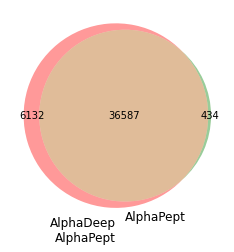

In [11]:
from matplotlib_venn import venn2
from alphadeep.rescore.fdr import calc_fdr_for_df
df_fdr = df[(df.fdr<0.01)&(df.decoy==0)]
ap_df = calc_fdr_for_df(df, 'score')
ap_df = ap_df[(ap_df.fdr<0.01)&(ap_df.decoy==0)]
venn2(
    [set(df_fdr.sequence.values), set(ap_df.sequence.values)],
    ['AlphaDeep\nAlphaPept','AlphaPept']
)